### Initial run

Initial end to end test, a sort of a "teaser" to highlight the motivation for `concurrent_dataloader`. 

In [1]:
from benchmarking.analysis.analyze_results import *

In [2]:
output_base_folder = Path("/iarai/home/ivan.svogor/storage-benchmarking/benchmark_output/motivation/last_run_2")

In [3]:
s3_folder_filter="*s3*"
scratch_folder_filter="*scratch*"

Load the data

In [4]:
df_dataloader_s3 = extract_timelines(output_base_folder, folder_filter=s3_folder_filter)
df_dataloader_scratch = extract_timelines(output_base_folder, folder_filter=scratch_folder_filter)


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:00<00:00, 206.26it/s]


Create "colors" and "lanes". Colors are used to distinguish different function types, e.g. function that loads a batch, calls the `next_data`, `run_traning_batch` from Lightning and `training_batch_to_device` also from lightning.
Lanes, every single call of the aforementioned funcitons in their own respective lane, so we get a nice overview of when the function is called, and how long it tookl

Extract the GPU Utilization data

In [5]:
df_gpuutil_s3 = extract_gpuutil(output_base_folder, folder_filter=s3_folder_filter, ms=True, skip=8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [01:09<00:00,  1.60it/s]


In [6]:
df_gpuutil_scratch = extract_gpuutil(output_base_folder, folder_filter=scratch_folder_filter, ms=True, skip=8)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:05<00:00, 19.68it/s]


### Plot function timelines for remote storage (AWS S3)

In [7]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
print(unique_functions)

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']


In [8]:
def show_timelines_with_gpu2(df, gpu_util, lanes, colors, run, flat=False, show_gpu=False, zoom=False, 
                            zoom_epochs=1, gpu_index="2", skip_plot=False, ms=False, fig_params=None, skip_title=False):
    fig, ax = None, None
    if not skip_plot:
        fig, ax = plt.subplots(figsize=(30, 25))
    if fig_params is None:
        plt.rcParams.update({"font.size": 18})
    else:
        plt.rcParams.update(fig_params)
    start = min(df["start_time_x"])
    end = max(df["end_time_y"])
    ts = "timestamp"
    if ms:
        ts = f"timestamp_{gpu_index}"
    print(ts, ms)
    gpu_start = min(gpu_util[ts])

    total_runtime = end - start
    number_of_epochs = 20
    ctr = 0
    if zoom:
        df = df[df["start_time_x"] < start + ((total_runtime / number_of_epochs) * zoom_epochs)]
        gpu_util = gpu_util[gpu_util[ts] < gpu_start + ((total_runtime / number_of_epochs) * zoom_epochs)]

    lane = 0
    filename = run.split("_")
    if not skip_plot:
        for _, row in df.sort_values(["start_time_x"], ascending=True).iterrows():
            duration = row["end_time_y"] - row["start_time_x"]
            x1 = row["start_time_x"] - start
            # if duration < 0.15:
            #     duration = 0.2
            x2 = x1 + duration
            if not flat:
                lane += 10
            else:
                lane = lanes[row["item_x"]]
            if(row["item_x"] == "run_training_batch"):
                ax.plot([x1, x2], [lane, lane], color=colors[row["item_x"]], label=row["item_x"], linewidth=3)
                ctr += 1
        print(f"Printed: {ctr}")

        ax.set_xlabel("Experiment duration (S)", loc="right")
        ax.set_ylabel("Operation activity lane", loc="center")

        ax.legend()
        ax.grid(linestyle="--", which="both")

        handles, labels = plt.gca().get_legend_handles_labels()
        by_label = dict(zip(labels, handles))

        # Put a legend below current axis
        ax.legend(
            by_label.values(),
            by_label.keys(),
            loc="upper center",
            bbox_to_anchor=(0.5, -0.05),
            fancybox=True,
            shadow=True,
            ncol=5,
        )

    gpu_util_mean_no_zeros = 0
    gpu_util_zeros = 0
    mem_util_mean_no_zeros = 0
    mem_util_mean = 0
    
    gpu_util_zeros = (len(gpu_util[gpu_util[f"gpu_util_{gpu_index}"] == 0][f"gpu_util_{gpu_index}"]) / len(gpu_util[f"gpu_util_{gpu_index}"])) * 100
    gpu_util_mean_no_zeros = np.mean(gpu_util[gpu_util[f"gpu_util_{gpu_index}"] > 0][f"gpu_util_{gpu_index}"])
    mem_util_mean = np.mean(gpu_util[f"mem_util_{gpu_index}"])
    mem_util_mean_no_zeros = np.mean(gpu_util[gpu_util[f"mem_util_{gpu_index}"] > 0][f"mem_util_{gpu_index}"])

    if show_gpu:
        ax2 = ax.twinx()
        ax2.set_ylabel("GPU/Memory utilization (green, maroon) [%]")

        r"{\fontsize{50pt}{3em}\selectfont{}a}{\fontsize{20pt}{3em}\selectfont{}N"
        ax2.set_ylim([-3, 103])
        gpu_events = []
        for i in gpu_util[ts]:
            gpu_events.append(i - start)
        ax2.plot(gpu_events, gpu_util[f"gpu_util_{gpu_index}"], color="cyan", linestyle="--", linewidth=2)
        ax2.plot(gpu_events, gpu_util[f"mem_util_{gpu_index}"], color="maroon", linestyle="--", linewidth=2)
        ax2.plot(
            gpu_events, [gpu_util_mean_no_zeros] * len(gpu_events), label="GPU Util Mean", linewidth=2, color="cyan"
        )
        ax2.plot(
            gpu_events, [mem_util_mean_no_zeros] * len(gpu_events), label="Mem Util Mean", linewidth=2, color="maroon"
        )
        print(gpu_util_mean_no_zeros, mem_util_mean_no_zeros)
        ax2.legend()

    gpu_util = ""
    if show_gpu:
        gpu_util = f"GPU unused: {round(gpu_util_zeros, 2)} %, mean GPU usage: {round(gpu_util_mean_no_zeros, 2)} %",
 
    if not skip_plot:
        ax.set_title(
            f"Total runtime per operation \n Implementation: {filename[9]},"
            # f" use cache: {filename[8]}, "
            f" batch size: {filename[5]}, "
            f" library: {filename[3]}, "
            f"{gpu_util}",
            loc="center",
        )

    plt.show()
 
    return {
        "runtime": end - start,
        "gpu_util_zero": gpu_util_zeros,
        "gpu_util_mean_no_zeros": gpu_util_mean_no_zeros,
        "mem_util_mean": mem_util_mean,
        "mem_util_mean_no_zeros": mem_util_mean_no_zeros,
        "implementation": filename[9],
        "cache": filename[8],
        "library": filename[3],
        "fig": fig,
    }


timestamp_2 True
Printed: 295


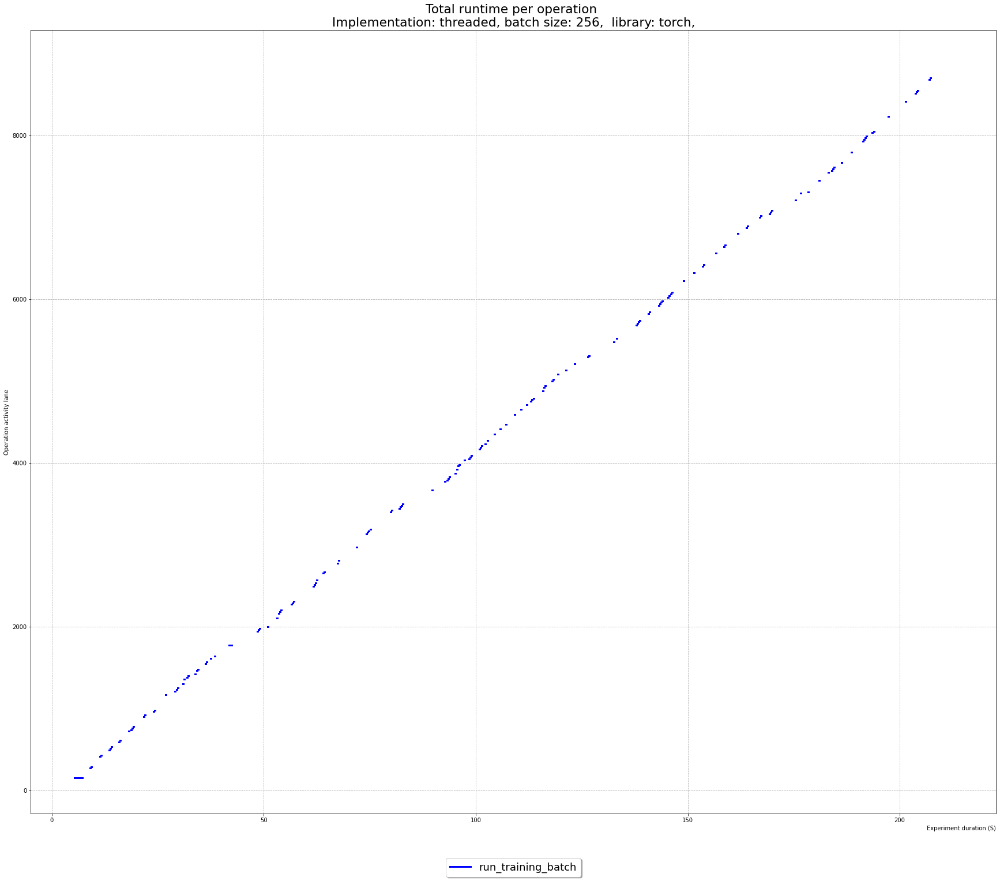

timestamp_2 True
Printed: 295


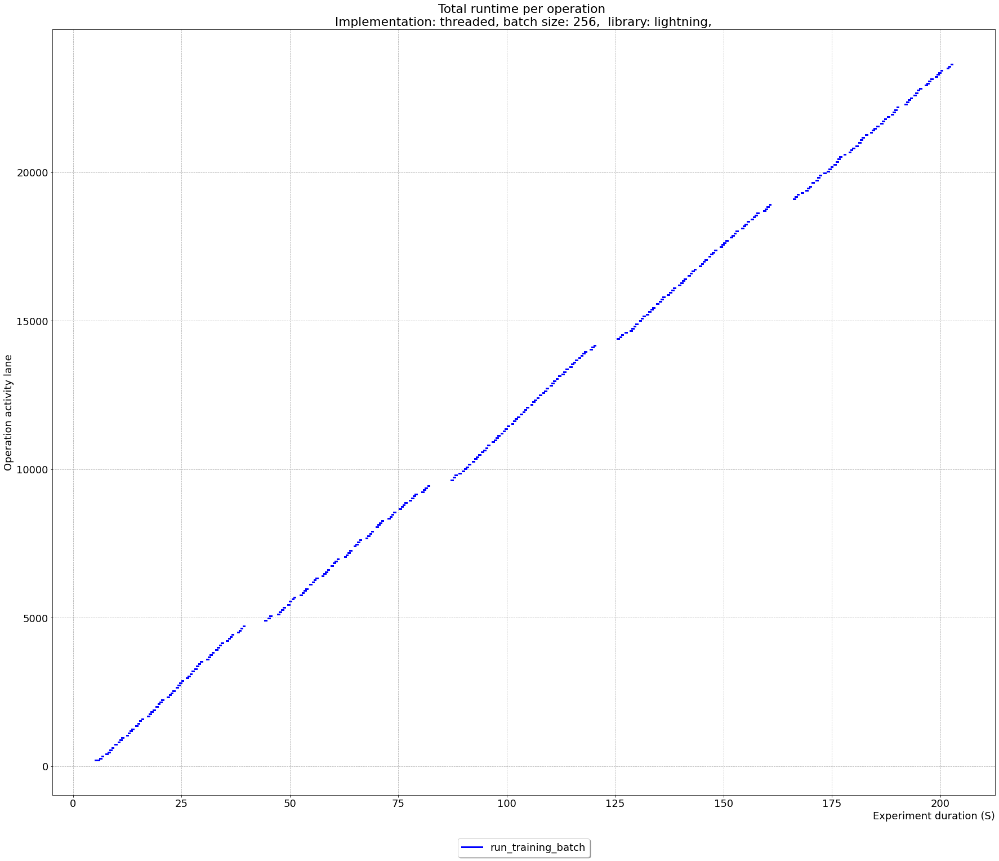

timestamp_2 True
Printed: 295


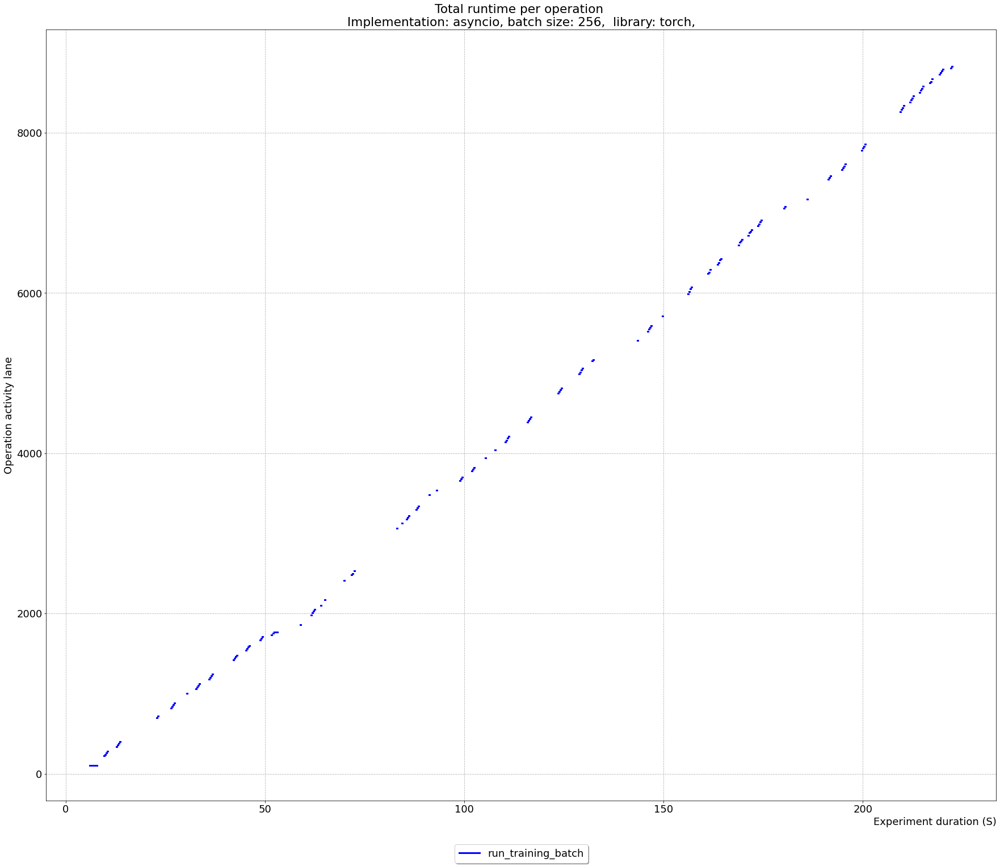

timestamp_2 True
Printed: 295


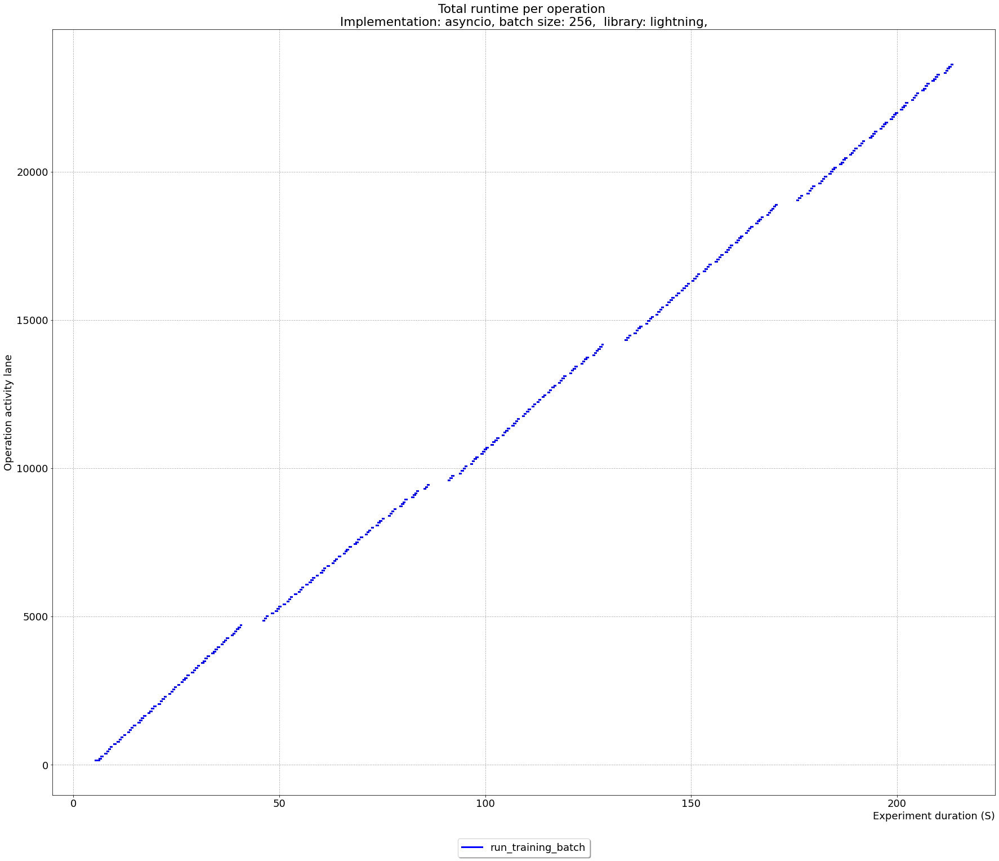

timestamp_2 True
Printed: 295


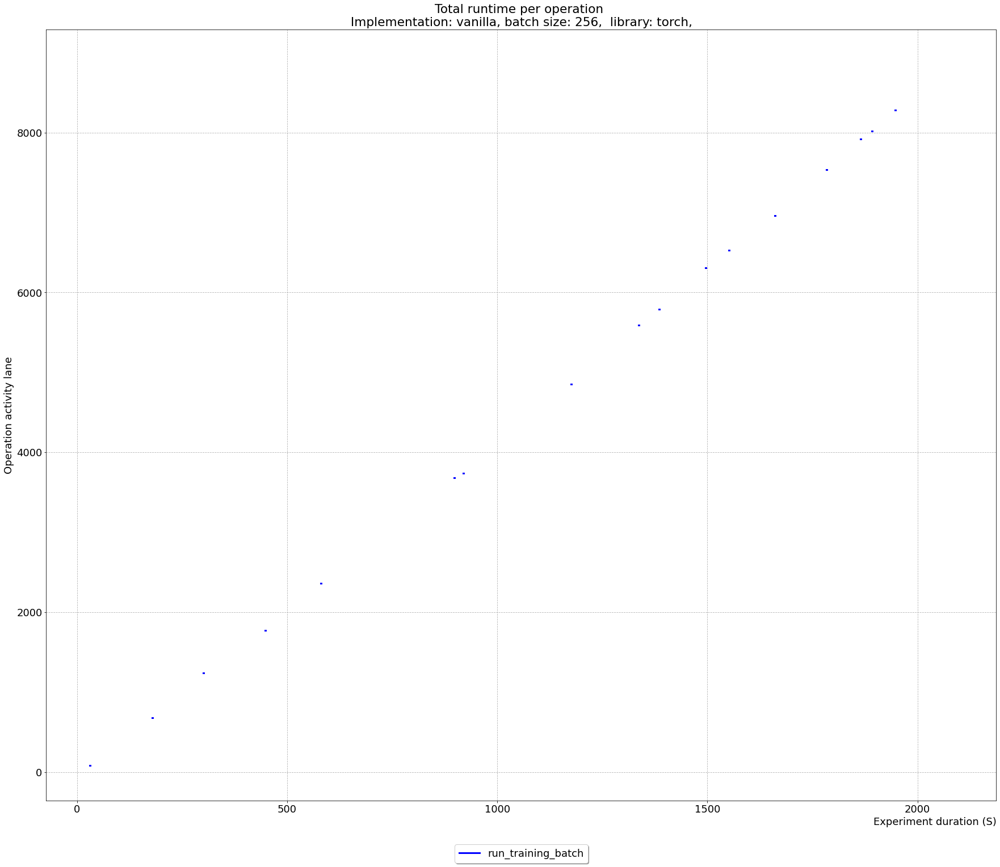

timestamp_2 True
Printed: 295


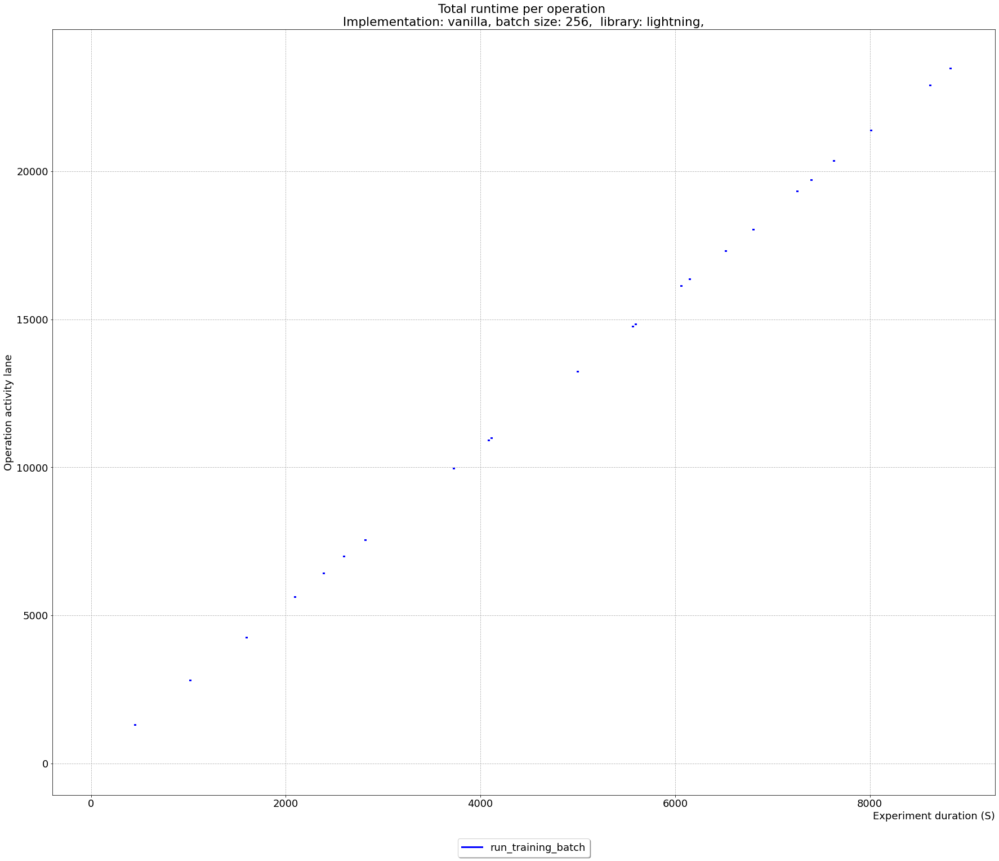

In [9]:
unique_runs_s3, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_s3)
returns_s3 = []

for run in sorted(unique_runs_s3):
    df = df_dataloader_s3[df_dataloader_s3["run"]==run]
    dfgpu = df_gpuutil_s3[df_gpuutil_s3["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False) 
    result = show_timelines_with_gpu2(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=False, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    df = df_dataloader_s3[(df_dataloader_s3["item_x"]=="run_training_batch")&(df_dataloader_s3["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_calc"] = (df["end_time_y"] - df["start_time_x"]).sum()
    df = df_dataloader_s3[(df_dataloader_s3["item_x"]=="training_batch_to_device")&(df_dataloader_s3["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_transf"] = (df["end_time_y"] - df["start_time_x"]).sum()
    result["run"]=run
    returns_s3.append(result)


### Plot function timelines for local storage

timestamp_2 True
86.97156832772852 48.09088098918083


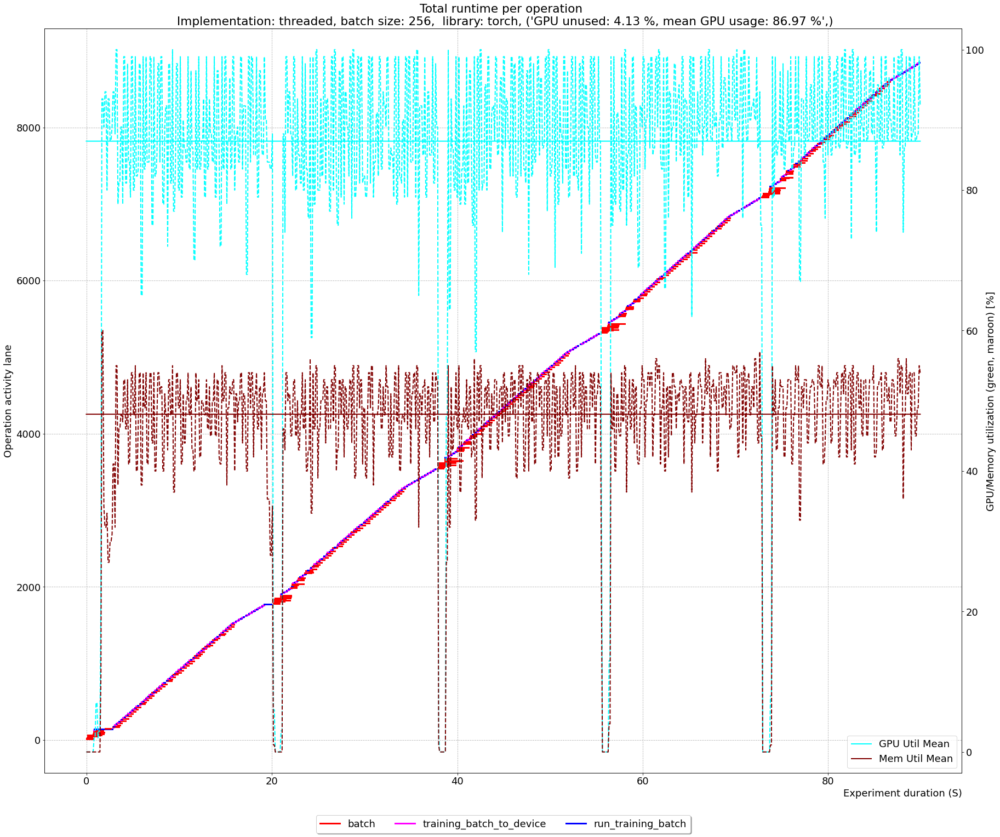

timestamp_2 True
83.52990206292978 23.53058596265293


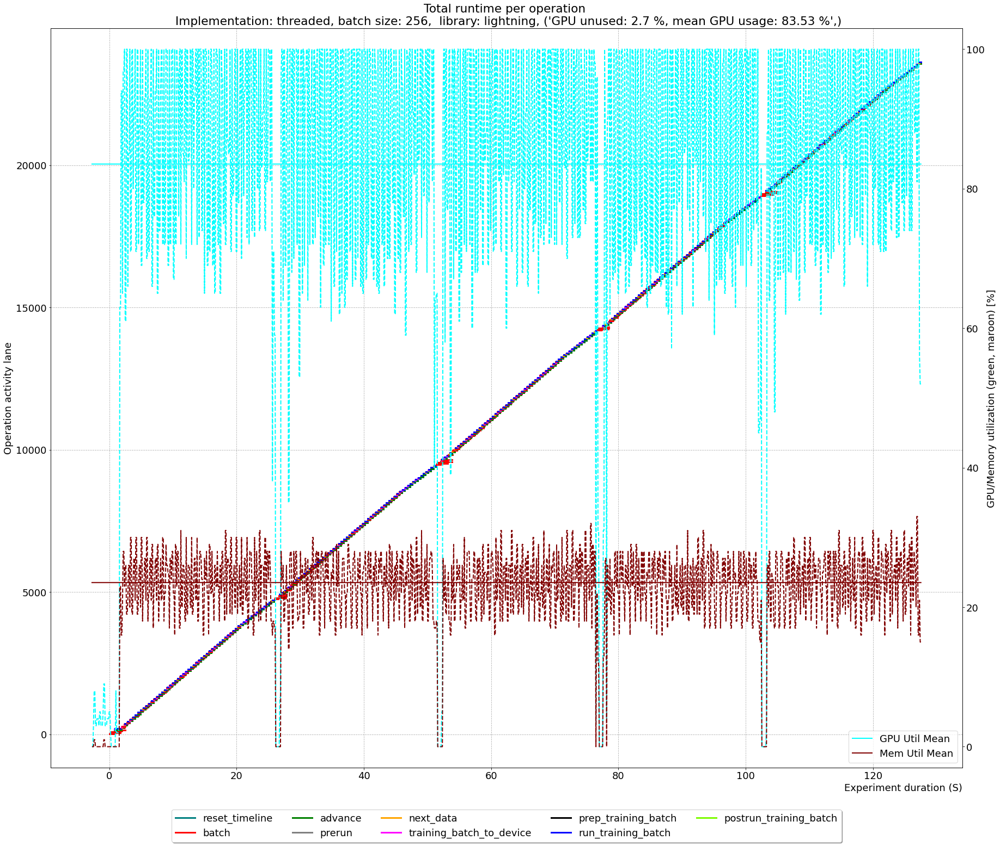

timestamp_2 True
86.79696509863429 47.80386147716825


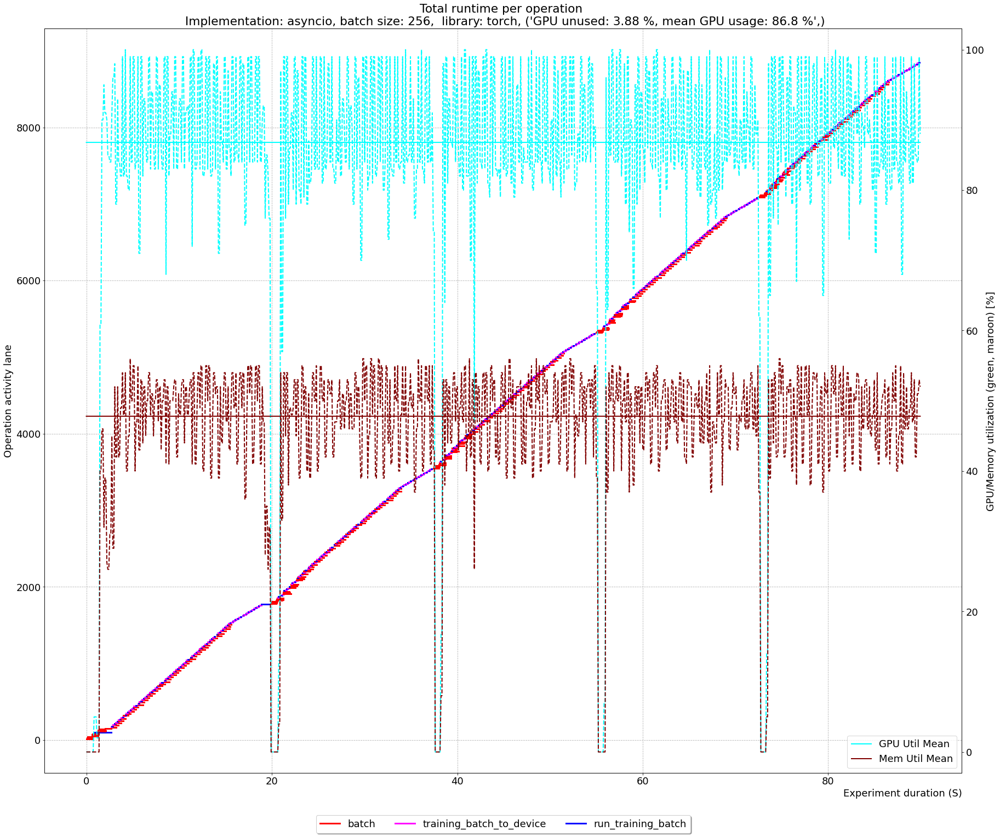

timestamp_2 True
84.15648933968123 23.15976205651158


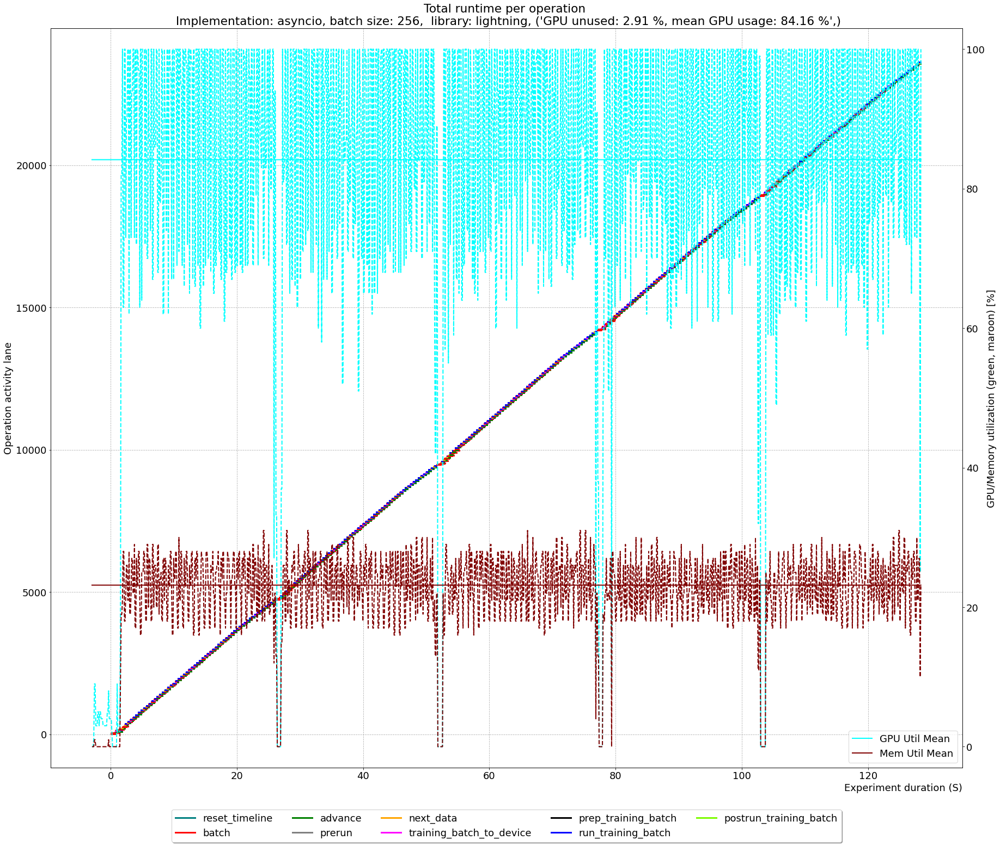

timestamp_2 True
77.76787192934033 43.80136402387042


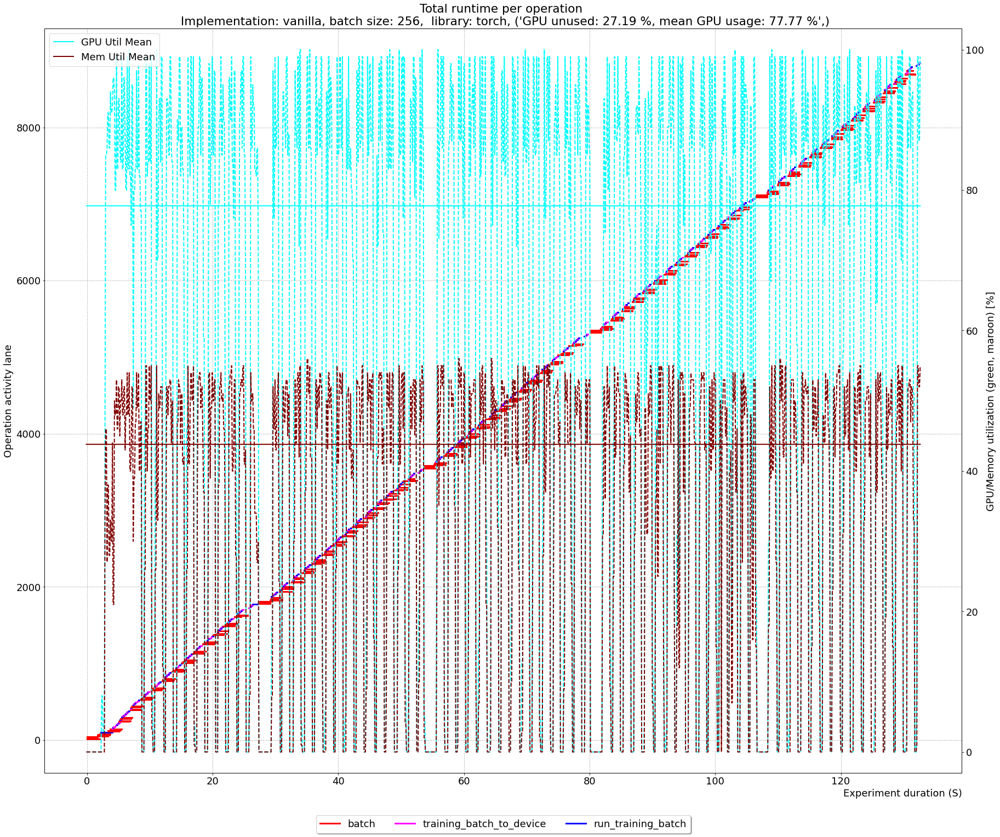

timestamp_2 True
63.892428365615494 19.15377809237303


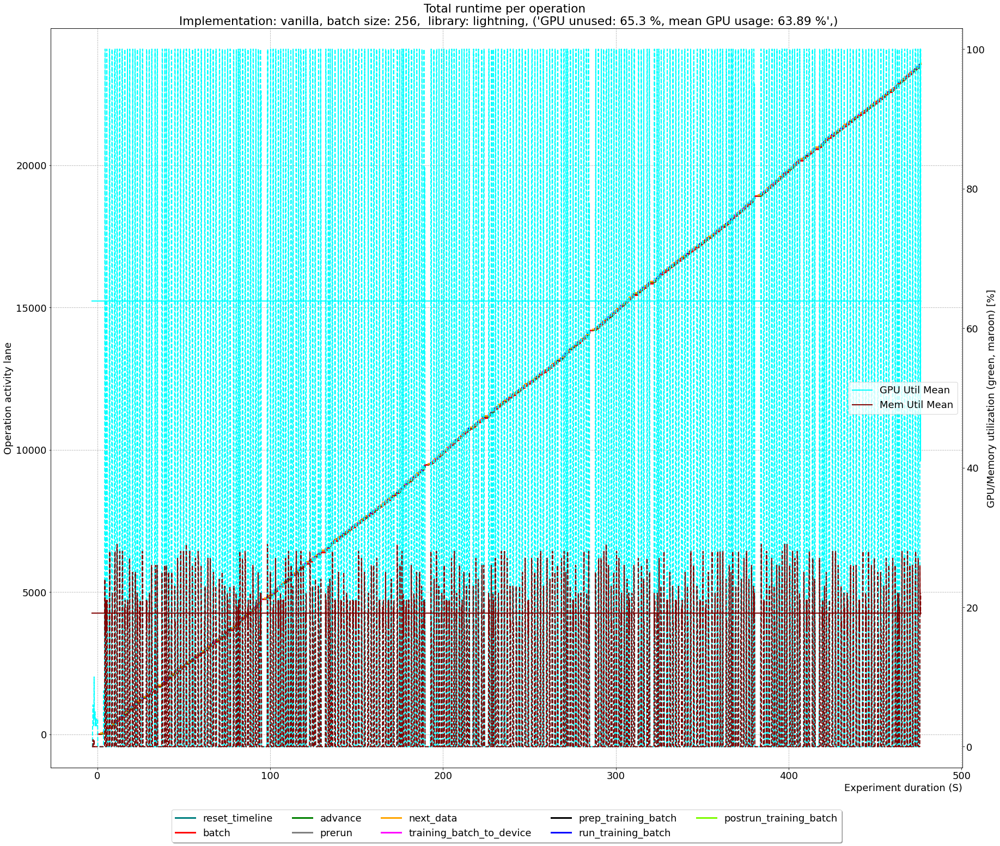

In [10]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
returns_scratch = []

for run in sorted(unique_runs_scratch):
    df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
    dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
    df = df.drop_duplicates(subset="id", keep="first", inplace=False)
    result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                     flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                     skip_plot=False, ms=True)
    df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch")&(df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_calc"] = (df["end_time_y"] - df["start_time_x"]).sum()
    df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device")&(df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
    result["duration_transf"] = (df["end_time_y"] - df["start_time_x"]).sum()
    result["run"]=run
    returns_scratch.append(result)

Get unique runs to loop through, and plot the results

### Result tables
Print throughput in loaded images per second, and function duration in seconds, for S3 and Scratch

In [11]:
# sanity check
get_metadata_info(output_base_folder / "" / unique_runs_s3[0])
5*59

Dataset:  15000
Batch size: 256
Epochs:  5
Images total:  75000
Batches per epoch 59
Images total (rounded):  75520


295

In [12]:
def get_batch_train_time(results, subfolder, df, unique_runs, output_base_folder):
    durations = []
    # functions are logged twice, decorator loggs twice?
    df = df.drop_duplicates(subset=['time_start', 'time_end'], keep="first", inplace=False) 
    for run in sorted(unique_runs):
        # we log bytes! -> b.getbuffer().nbytes or os.path.getsize
        durations.append(df[(df["run"]==run) & (df["trace_name"]=="(7)_batch_advance")]["elapsed"].sum())
#         df_full_scratch[df_full_scratch["trace_name"]=="(7)_batch_advance"]
        print(len(df[(df["run"]==run) & (df["trace_name"]=="(7)_batch_advance")]))

    results["batch_duration"] = durations

    return results

In [14]:
df_full_s3 = extract_pandas(output_base_folder, folder_filter=s3_folder_filter)
results_s3 = pd.DataFrame.from_records(data=returns_s3)
r_s3 = get_throughput(results_s3, "", df_full_s3, unique_runs_s3, output_base_folder)
r_s3 = get_batch_train_time(r_s3, "", df_full_s3, unique_runs_s3, output_base_folder)
r_s3["data_part"] = r_s3["runtime"] - r_s3["batch_duration"] 
r_s3["gpu_tp_both"] = (r_s3["dl_MB"] * 8) / (r_s3["duration_transf"] + r_s3["duration_calc"])
r_s3["gpu_tp"] = (r_s3["dl_MB"] * 8) / (r_s3["duration_calc"])

r_s3.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:09<00:00, 11.87it/s]


0
295
0
295
0
295


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s,batch_duration,data_part,gpu_tp_both,gpu_tp
0,212.39,49.69,70.58,19.47,41.06,threaded,1,torch,Figure(2160x1800),25.14,35.05,353.13,8130.89,75000,306.27,38.28,0.00,212.39,1080.72,2587.65
1,202.70,30.29,74.11,13.99,21.46,threaded,1,lightning,Figure(2160x1800),103.68,13.59,370.00,8096.33,75000,319.54,39.94,103.59,99.11,552.33,624.72
2,222.66,54.16,73.95,18.51,42.61,asyncio,1,torch,Figure(2160x1800),25.11,36.54,336.84,8464.63,75000,304.13,38.02,0.00,222.66,1098.41,2696.62
3,213.35,34.89,75.24,13.38,21.50,asyncio,1,lightning,Figure(2160x1800),103.60,10.71,351.54,8464.63,75000,317.40,39.67,103.51,109.84,592.38,653.64
4,2084.73,94.95,72.15,2.10,44.29,vanilla,1,torch,Figure(2160x1800),25.98,33.54,35.98,8464.63,75000,32.48,4.06,0.00,2084.73,1137.66,2606.60
5,8845.82,98.05,63.31,0.34,19.23,vanilla,1,lightning,Figure(2160x1800),106.56,13.33,8.48,8464.63,75000,7.66,0.96,106.50,8739.32,564.80,635.47


In [15]:
df_full_scratch = extract_pandas(output_base_folder, folder_filter=scratch_folder_filter)
results_scratch = pd.DataFrame.from_records(data=returns_scratch)
r_scratch = get_throughput(results_scratch, "", df_full_scratch, unique_runs_scratch, output_base_folder)
r_scratch.round(2)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111/111 [00:09<00:00, 11.85it/s]


,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s
0,89.86,4.13,86.97,45.60,48.09,threaded,1,torch,Figure(2160x1800),24.96,47.37,834.60,9263.88,75000,824.70,103.09
1,127.50,2.70,83.53,22.23,23.53,threaded,1,lightning,Figure(2160x1800),103.57,12.09,588.25,9259.50,75000,581.00,72.62
2,89.87,3.88,86.80,45.50,47.80,asyncio,1,torch,Figure(2160x1800),24.84,47.57,834.52,8456.77,75000,752.78,94.10
3,128.33,2.91,84.16,21.91,23.16,asyncio,1,lightning,Figure(2160x1800),103.70,12.36,584.42,8456.77,75000,527.18,65.90
4,132.62,27.19,77.77,30.98,43.80,vanilla,1,torch,Figure(2160x1800),25.39,34.99,565.53,8456.77,75000,510.14,63.77
5,476.44,65.30,63.89,6.01,19.15,vanilla,1,lightning,Figure(2160x1800),103.67,12.23,157.42,8456.77,75000,142.00,17.75


In [16]:
# LaTeX style
# matplotlib.rcParams['mathtext.fontset'] = 'stix'
# matplotlib.rcParams['font.family'] = 'STIXGeneral'
# matplotlib.pyplot.title(r'ABC123 vs $\mathrm{ABC123}^{123}$')

# matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [17]:
torch_s3 = r_s3[r_s3["library"]=="torch"]
lightning_s3 = r_s3[r_s3["library"]=="lightning"]

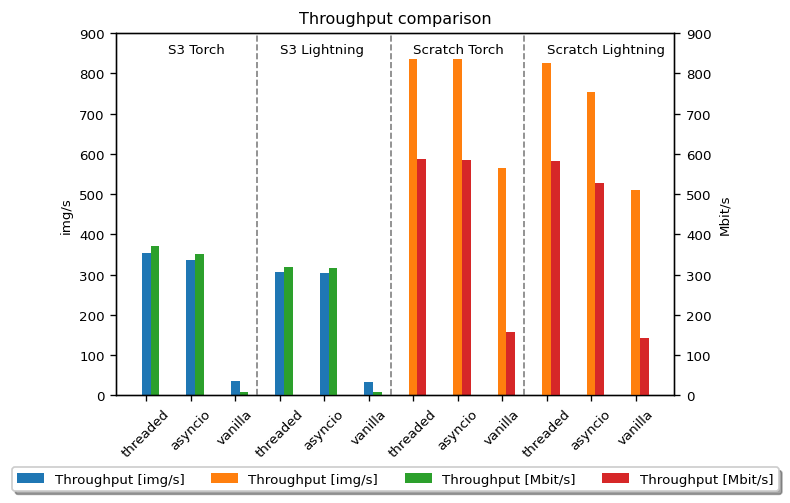

In [18]:
matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(dpi=120)
offset = 0
offset2 = 3

sc_offset = 6
sc_offset2 = 9

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+offset, width=width, label=lab)
    offset += 0.2
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+offset2, width=width)
    offset2 += 0.2
    
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=np.arange(len(curr))+sc_offset, width=width, label=lab)
    sc_offset += 0.2
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax2.bar(height=curr, x=np.arange(len(curr))+sc_offset2, width=width)
    sc_offset2 += 0.2
    
ax.text(0.5, 850, "S3 Torch")
ax.text(3.0, 850, "S3 Lightning")
ax.text(6.0, 850, "Scratch Torch")
ax.text(9.0, 850, "Scratch Lightning")


ax.set_ylabel("img/s")
ax2.set_ylabel("Mbit/s")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 900])
# ax.grid(linestyle="--", which="both")

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.18),
          fancybox=True, shadow=True, ncol=5)

ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
ax.set_title("Throughput comparison")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=1)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=1)


In [19]:
!pip install latex

In [20]:
font_size=30
params = {'legend.fontsize': font_size,
          'figure.figsize': (25, 20),
          'axes.labelsize': font_size,
          'axes.titlesize': font_size,
          'xtick.labelsize': font_size,
          'ytick.labelsize': font_size}

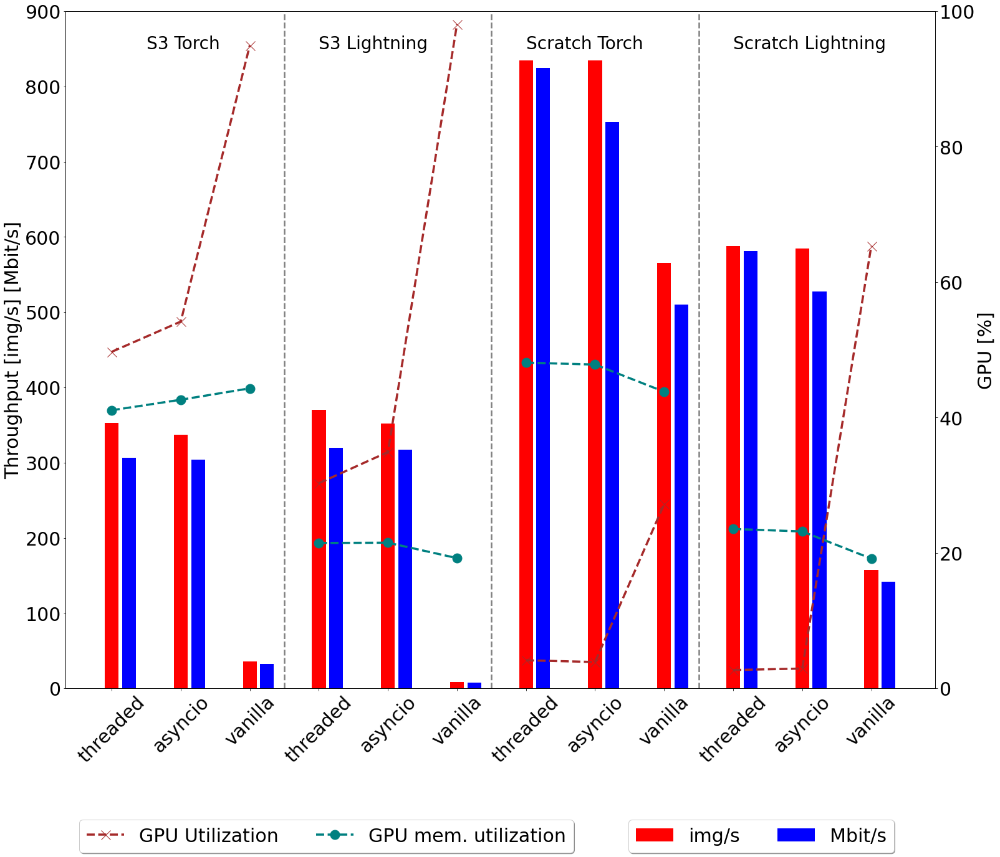

In [21]:

# plt.rcParams.update({
#   "text.usetex": True,
#   "font.family": "Helvetica"
# })
plt.rcParams.update(params)
# matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots()
offset = 0
offset2 = 6
gpu_offset = 0
gpu_offset2 = 0

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    # S3
    curr = r_s3[r_s3["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset for i in range(3)], width=width, label="img/s", color="red")
    curr = r_s3[r_s3["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset += 3
    # Scratch
    curr = r_scratch[r_scratch["library"]==lib]["throughput"]
    ax.bar(height=curr, x=[i + offset2 for i in range(3)], width=width, label="img/s", color="red")
    curr = r_scratch[r_scratch["library"]==lib]["Mbit/s"]
    ax.bar(height=curr, x=[i + offset2 + 0.25 for i in range(3)], width=width, label="Mbit/s", color="blue")
    offset2 += 3
    # GPU Util
    ax2.plot([i + gpu_offset for i in range(3)], r_s3[r_s3["library"]==lib]["gpu_util_zero"],
             marker = 'x', markersize = 15, color="brown", linestyle="--", linewidth=3.5, label="GPU Utilization")
    ax2.plot([i + gpu_offset for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["gpu_util_zero"],
         marker = 'x', markersize = 15, color="brown", linestyle="--", linewidth=3.5, label="GPU Utilization")
    gpu_offset += 3
    
    # GPU Unused
    ax2.plot([i + gpu_offset2 for i in range(3)], r_s3[r_s3["library"]==lib]["mem_util_mean_no_zeros"],
             marker = 'o', markersize = 15, color="teal", linestyle="--", linewidth=3.5, label="GPU mem. utilization")
    ax2.plot([i + gpu_offset2 for i in range(6, 9)], r_scratch[r_scratch["library"]==lib]["mem_util_mean_no_zeros"],
         marker = 'o', markersize = 15, color="teal", linestyle="--", linewidth=3.5, label="GPU mem. utilization")
    gpu_offset2 += 3
    
ax.text(0.5, 850, "S3 Torch", fontsize=28)
ax.text(3.0, 850, "S3 Lightning", fontsize=28)
ax.text(6.0, 850, "Scratch Torch", fontsize=28)
ax.text(9.0, 850, "Scratch Lightning", fontsize=28)


ax.set_ylabel("Throughput [img/s] [Mbit/s]")
ax2.set_ylabel("GPU [%]")
    
ax.set_ylim([0, 900])
ax2.set_ylim([0, 100])

ax.legend()
ax2.legend()


ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
# ax.set_title("Implementation and library comparison, throughput and GPU utilization")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=2.5)

handles, labels = ax2.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax2.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.3, -0.18),
          fancybox=True, shadow=True, ncol=2)

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='upper center', bbox_to_anchor=(0.8, -0.18),
          fancybox=True, shadow=True, ncol=2)

fig.savefig(f"final_measurements.pdf", bbox_inches='tight')

# new

In [22]:
r_scratch["gpu_tp_both"] = (r_scratch["dl_MB"] * 8) / (r_scratch["duration_transf"] + r_scratch["duration_calc"])
r_scratch["gpu_tp"] = (r_scratch["dl_MB"] * 8) / r_scratch["duration_calc"] 
r_scratch["imgs_proc"] = (r_scratch["imgs"]) / r_scratch["duration_calc"]
r_scratch

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,duration_transf,throughput,dl_MB,imgs,Mbit/s,MB/s,gpu_tp_both,gpu_tp,imgs_proc
0,89.863908,4.132474,86.971568,45.596131,48.090881,threaded,1,torch,Figure(2160x1800),24.955010,47.372504,834.595352,9263.881648,75000,824.703207,103.087901,1024.659219,2969.786591,3005.408569
1,127.497669,2.696675,83.529902,22.228102,23.530586,threaded,1,lightning,Figure(2160x1800),103.569389,12.087433,588.246051,9259.504560,75000,580.999146,72.624893,640.481340,715.230986,724.152189
2,89.871845,3.879813,86.796965,45.502917,47.803861,asyncio,1,torch,Figure(2160x1800),24.837067,47.570339,834.521648,8456.771183,75000,752.784920,94.098115,934.354282,2723.919445,3019.680236
3,128.331885,2.913987,84.156489,21.907757,23.159762,asyncio,1,lightning,Figure(2160x1800),103.701750,12.362026,584.422181,8456.771183,75000,527.181297,65.897662,582.905122,652.391783,723.227912
4,132.619013,27.190514,77.767872,30.976085,43.801364,vanilla,1,torch,Figure(2160x1800),25.385617,34.993119,565.529772,8456.771183,75000,510.139294,63.767412,1120.496622,2665.059093,2954.428878
5,476.439454,65.302155,63.892428,6.011886,19.153778,vanilla,1,lightning,Figure(2160x1800),103.665990,12.229057,157.417694,8456.771183,75000,141.999511,17.749939,583.753759,652.616828,723.477392


In [23]:
r_s3["gpu_tp_both"] = (r_s3["dl_MB"] * 8) / (r_s3["duration_transf"] + r_s3["duration_calc"])
r_s3["gpu_tp"] = (r_s3["dl_MB"] * 8) / r_s3["duration_calc"] 
r_s3["imgs_proc"] = (r_s3["imgs"]) / r_s3["duration_calc"]

r_s3

,runtime,gpu_util_zero,gpu_util_mean_no_zeros,mem_util_mean,mem_util_mean_no_zeros,implementation,cache,library,fig,duration_calc,...,throughput,dl_MB,imgs,Mbit/s,MB/s,batch_duration,data_part,gpu_tp_both,gpu_tp,imgs_proc
0,212.388137,49.689518,70.579857,19.473299,41.057607,threaded,1,torch,Figure(2160x1800),25.137522,...,353.127067,8130.889072,75000,306.265281,38.283160,0.000000,212.388137,1080.722925,2587.650128,2983.587616
1,202.700202,30.289447,74.114091,13.990651,21.457278,threaded,1,lightning,Figure(2160x1800),103.679477,...,370.004566,8096.329530,75000,319.539082,39.942385,103.588534,99.111667,552.327065,624.719938,723.383280
2,222.655077,54.156798,73.946784,18.506395,42.614671,asyncio,1,torch,Figure(2160x1800),25.111785,...,336.843879,8464.628749,75000,304.134228,38.016778,0.000000,222.655077,1098.407846,2696.623473,2986.645464
3,213.349916,34.887969,75.239574,13.382124,21.501467,asyncio,1,lightning,Figure(2160x1800),103.599251,...,351.535175,8464.628749,75000,317.398907,39.674863,103.505427,109.844489,592.384181,653.644013,723.943459
4,2084.734875,94.952685,72.153281,2.104258,44.294213,vanilla,1,torch,Figure(2160x1800),25.979017,...,35.975798,8464.628749,75000,32.482322,4.060290,0.000000,2084.734875,1137.655360,2606.604830,2886.945311
5,8845.823194,98.052038,63.314915,0.337998,19.225279,vanilla,1,lightning,Figure(2160x1800),106.561411,...,8.478578,8464.628749,75000,7.655255,0.956907,106.501872,8739.321322,564.796377,635.474222,703.819507


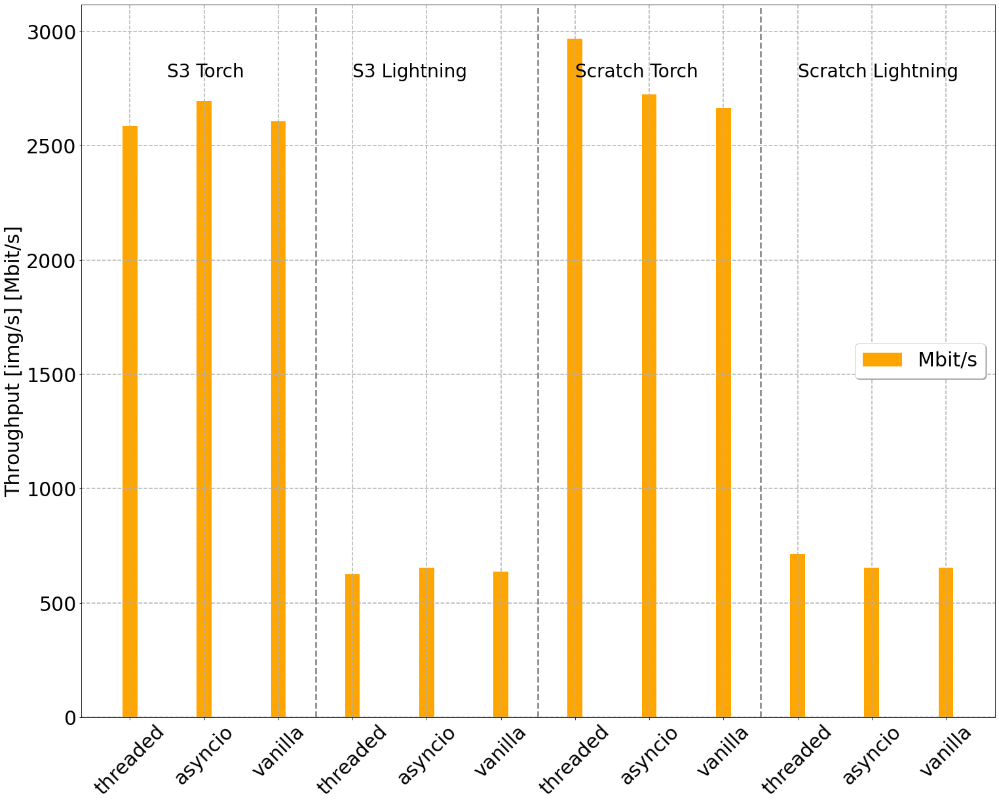

In [24]:

# plt.rcParams.update({
#   "text.usetex": True,
#   "font.family": "Helvetica"
# })
plt.rcParams.update(params)
# matplotlib.rcParams.update({'font.size': 8})
fig, ax = plt.subplots()
offset = 0
offset2 = 6
gpu_offset = 0
gpu_offset2 = 0

width = 0.2
labels = ['threaded', 'asyncio', 'vanilla', 'threaded', 'asyncio', 'vanilla'] * 2


# ax2 = ax.twinx()
for lib, lab in zip(["torch", "lightning"], ["Throughput [img/s]", "Throughput [Mbit/s]"]):
    # S3
    key = "gpu_tp" if lib == "lightning" else "gpu_tp_both"
    
    curr = r_s3[r_s3["library"]==lib]["gpu_tp"]
    ax.bar(height=curr, x=[i + offset for i in range(3)], width=width, label="Mbit/s", color="orange")
    offset += 3
    # Scratch
    curr = r_scratch[r_scratch["library"]==lib]["gpu_tp"]
    ax.bar(height=curr, x=[i + offset2 for i in range(3)], width=width, label="Mbit/s", color="orange")
    offset2 += 3

    
ax.text(0.5, 2800, "S3 Torch", fontsize=28)
ax.text(3.0, 2800, "S3 Lightning", fontsize=28)
ax.text(6.0, 2800, "Scratch Torch", fontsize=28)
ax.text(9.0, 2800, "Scratch Lightning", fontsize=28)


ax.grid(linestyle="--", which="both", linewidth=1.5)
ax.set_ylabel("Throughput [img/s] [Mbit/s]")
# ax.set_ylim([0, 2900])
ax.legend()


ax.set_xticks(np.arange(len(r_s3)*2), labels, rotation="45")
# ax.set_title("Implementation and library comparison, throughput and GPU utilization")
plt.axvline(x=2.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=5.5, color="gray", linestyle="--", linewidth=2.5)
plt.axvline(x=8.5, color="gray", linestyle="--", linewidth=2.5)

handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='center right',
          fancybox=True, shadow=True, ncol=2)

# fig.savefig(f"gpu_throughput.pdf", bbox_inches='tight')

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']
timestamp_2 True
83.52990206292978 23.53058596265293


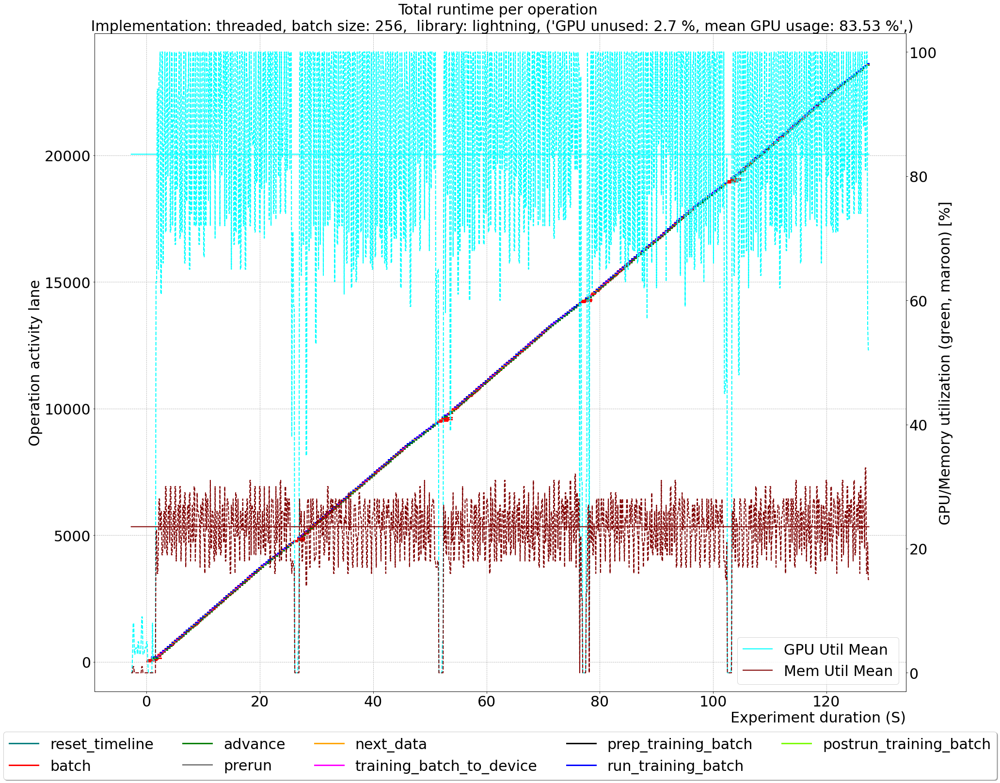

,item_x,id,start_time_x,item_y,end_time_y,source_file,run,duration_td
17,training_batch_to_device,1.518509e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.057014
25,training_batch_to_device,6.874710e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.042693
35,training_batch_to_device,4.462441e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.050938
45,training_batch_to_device,1.801312e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.042843
53,training_batch_to_device,3.696615e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.039860
62,training_batch_to_device,7.838729e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.039826
71,training_batch_to_device,6.222344e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.039668
80,training_batch_to_device,6.783563e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.047755
89,training_batch_to_device,8.954642e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.039600
98,training_batch_to_device,4.508164e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f235116_benchmark_e2e_lightning_scratc...,0.039794


{'runtime': 127.49766850471497,
 'gpu_util_zero': 2.6966747769667476,
 'gpu_util_mean_no_zeros': 83.52990206292978,
 'mem_util_mean': 22.228102189781023,
 'mem_util_mean_no_zeros': 23.53058596265293,
 'implementation': 'threaded',
 'cache': '1',
 'library': 'lightning',
 'fig': <Figure size 2160x1800 with 2 Axes>,
 'duration_tr': 103.56938934326172,
 'duration_b': 177.4422070980072,
 'duration_td': 12.087432861328125}

103.56938934326172
177.4422070980072
12.087432861328125


In [25]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
print(unique_functions)
pd.set_option('display.max_rows', None)

rs = []

for run in sorted(unique_runs_scratch):
    if "lightning" in run:
        df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
        dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
        df = df.drop_duplicates(subset="id", keep="first", inplace=False)
        result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                         flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                         skip_plot=False, ms=True)
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_tr"] = df["end_time_y"] - df["start_time_x"]
        result["duration_tr"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_b"] = df["end_time_y"] - df["start_time_x"]
        result["duration_b"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_td"] = df["end_time_y"] - df["start_time_x"]
        result["duration_td"] = (df["end_time_y"] - df["start_time_x"]).sum()
    #     result["run"]=run
    #     rs.append(result)
        current_df = df[df["run"]==run]
        display(current_df)
        display(result)
        print(result["duration_tr"].sum())
        print(result["duration_b"].sum())
        print(result["duration_td"].sum())
        break

['advance', 'next_data', 'postrun_training_batch', 'prep_training_batch', 'prerun', 'reset_timeline', 'batch', 'training_batch_to_device', 'run_training_batch']
timestamp_2 True
86.97156832772852 48.09088098918083


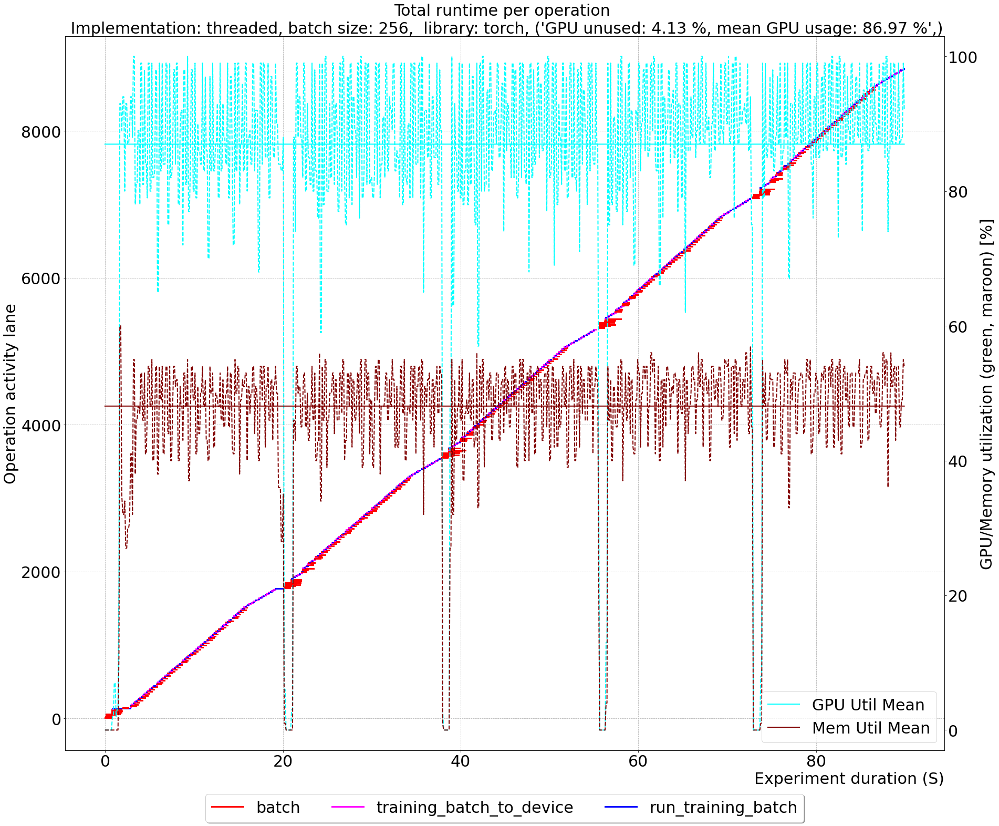

,item_x,id,start_time_x,item_y,end_time_y,source_file,run,duration_td
12,training_batch_to_device,2.810864e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.061570
15,training_batch_to_device,5.794139e+17,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.073088
19,training_batch_to_device,7.089575e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.185287
22,training_batch_to_device,3.743574e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.193927
24,training_batch_to_device,2.791281e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.150222
...,...,...,...,...,...,...,...,...
875,training_batch_to_device,1.693973e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.173407
877,training_batch_to_device,3.374169e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.175587
879,training_batch_to_device,2.037576e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.190928
881,training_batch_to_device,8.883269e+18,1.646693e+09,training_batch_to_device,1.646693e+09,/iarai/home/ivan.svogor/storage-benchmarking/b...,20220307f234942_benchmark_e2e_torch_scratch_25...,0.189818


{'runtime': 89.86390805244446,
 'gpu_util_zero': 4.132473622508793,
 'gpu_util_mean_no_zeros': 86.97156832772852,
 'mem_util_mean': 45.59613130128957,
 'mem_util_mean_no_zeros': 48.09088098918083,
 'implementation': 'threaded',
 'cache': '1',
 'library': 'torch',
 'fig': <Figure size 2160x1800 with 2 Axes>,
 'duration_tr': 24.955009698867798,
 'duration_b': 185.72405672073364,
 'duration_td': 47.37250351905823}

24.955009698867798
185.72405672073364
47.37250351905823


In [26]:
unique_runs_scratch, unique_functions, colors, lanes = get_colors_runs_and_lanes(df_dataloader_scratch)
print(unique_functions)
pd.set_option('display.max_rows', 20)

rs = []

for run in sorted(unique_runs_scratch):
    if "torch" in run:
        df = df_dataloader_scratch[df_dataloader_scratch["run"]==run]
        dfgpu = df_gpuutil_scratch[df_gpuutil_scratch["run"]==run]
        df = df.drop_duplicates(subset="id", keep="first", inplace=False)
        result = show_timelines_with_gpu(df=df, gpu_util=dfgpu, lanes=lanes, colors=colors, run=run, 
                                         flat=False, show_gpu=True, zoom=False, zoom_epochs=2,
                                         skip_plot=False, ms=True)
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="run_training_batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_tr"] = df["end_time_y"] - df["start_time_x"]
        result["duration_tr"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="batch") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_b"] = df["end_time_y"] - df["start_time_x"]
        result["duration_b"] = (df["end_time_y"] - df["start_time_x"]).sum()
        
        df = df_dataloader_scratch[(df_dataloader_scratch["item_x"]=="training_batch_to_device") & (df_dataloader_scratch["run"]==run)].drop_duplicates(subset=['id'], keep="first", inplace=False) 
        df["duration_td"] = df["end_time_y"] - df["start_time_x"]
        result["duration_td"] = (df["end_time_y"] - df["start_time_x"]).sum()
    #     result["run"]=run
    #     rs.append(result)
        current_df = df[df["run"]==run]
        display(current_df)
        display(result)
        print(result["duration_tr"].sum())
        print(result["duration_b"].sum())
        print(result["duration_td"].sum())
        break

In [27]:
print(np.unique(df_full_scratch["trace_name"]))
print(np.unique(df_full_scratch["function_name"]))
df_full_scratch[df_full_scratch["trace_name"]=="(7)_batch_advance"]

['(3)-worker_loop' '(4)-asyncmapdataset-fetcher' '(4)-fetcher'
 '(4)-threadedmapdataset-fetcher' '(5)-get_item' '(6)-advance'
 '(7)_batch_advance' '(8)-start_train']
['__getitem__' '_worker_loop' 'advance' 'fetch' 'start_train' 'yield_item']


,trace_name,trace_level,function_name,elapsed,time_start,time_end,process_time,process_time_start,process_time_end,pid,...,prepare_data_per_node,plugins,amp_backend,amp_level,move_metrics_to_cpu,multiple_trainloader_mode,stochastic_weight_avg,terminate_on_nan,data_path,workers
3080,(7)_batch_advance,7,advance,1.006600,1.646693e+09,1.646693e+09,0.912702,8.666583,9.579285,21511,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
3614,(7)_batch_advance,7,advance,0.350386,1.646693e+09,1.646693e+09,0.349650,9.651672,10.001322,21511,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
4088,(7)_batch_advance,7,advance,0.350647,1.646693e+09,1.646693e+09,0.350874,10.077344,10.428219,21511,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
4368,(7)_batch_advance,7,advance,0.351466,1.646693e+09,1.646693e+09,0.351651,10.516941,10.868592,21511,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
4627,(7)_batch_advance,7,advance,0.351271,1.646693e+09,1.646693e+09,0.351303,10.929114,11.280417,21511,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75275,(7)_batch_advance,7,advance,0.350847,1.646695e+09,1.646695e+09,0.351043,130.204416,130.555458,32849,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
75541,(7)_batch_advance,7,advance,0.350576,1.646695e+09,1.646695e+09,0.350760,130.627531,130.978290,32849,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
75773,(7)_batch_advance,7,advance,0.352765,1.646695e+09,1.646695e+09,0.353012,131.044842,131.397854,32849,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
75881,(7)_batch_advance,7,advance,0.351632,1.646695e+09,1.646695e+09,0.351706,131.464437,131.816142,32849,...,None,None,native,None,False,max_size_cycle,False,None,None,1.0
